In [38]:
import numpy as np
import matplotlib.pyplot as plt
import random
import tensorflow as tf
from tensorflow.keras import layers, Model
from tensorflow.keras.callbacks import Callback
import time
from matplotlib import animation
from IPython.display import HTML

# Mandelbrot generator

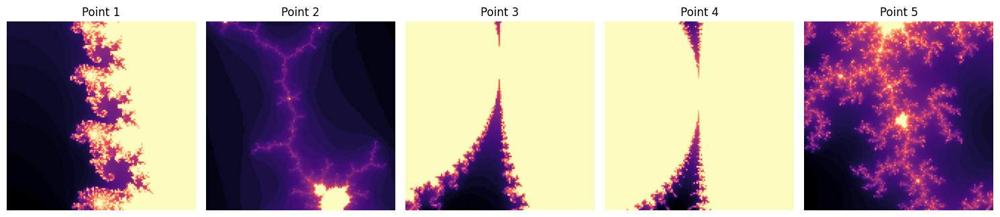

In [1]:
def generate_mandelbrot(center_real, center_imag, zoom, size=128, max_iter=256):
    width = 3.5 / zoom
    x = np.linspace(center_real - width/2, center_real + width/2, size)
    y = np.linspace(center_imag - width/2, center_imag + width/2, size)
    
    # Create coordinate grid
    X, Y = np.meshgrid(x, y)
    C = X + 1j * Y
    Z = np.zeros_like(C)
    # To track escape time
    img = np.zeros(C.shape, dtype=float)
    
    for i in range(max_iter):
        # Only update points that haven't escaped (masking)
        mask = np.abs(Z) <= 2
        Z[mask] = Z[mask]**2 + C[mask]
        img[mask] += 1
        
    # Log-normalize
    img = np.log(img + 1) / np.log(max_iter + 1)
    return img

interest_points = [
    (-0.743643, 0.131825, 100),    # Seahorse Valley
    (-0.170337, -1.06506, 50),     # The Tendrils
    (-0.75, 0.1, 10),              # Main Bulbs
    (-1.25, 0.01, 40),             # Triple Spiral
    (0.273226, 0.595153, 200),     # The Sun
    (-0.81153, 0.20143, 500)       # Deep Spiral
]

# Generate and Display Samples
plt.figure(figsize=(15, 5))
for i, (re, im, z) in enumerate(interest_points[:5]):
    tile = generate_mandelbrot(re, im, z)
    plt.subplot(1, 5, i+1)
    plt.imshow(tile, cmap='magma')
    plt.title(f"Point {i+1}")
    plt.axis('off')
plt.tight_layout()
plt.show()

# Automatically find interesting parts of the fractal

Hunting for 10 interesting regions...


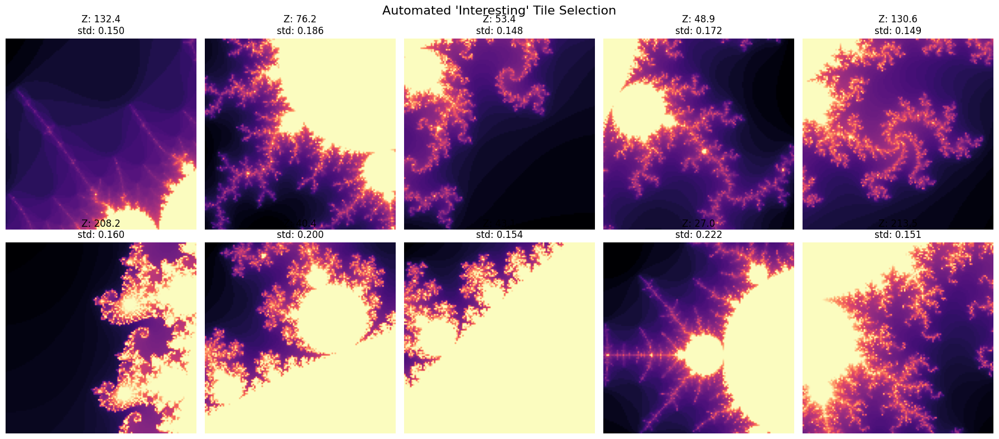

Final Dataset Shape: (10, 128, 128, 1)


In [40]:
def hunt_coordinates(num_samples=10, min_std=0.15):
    tiles = []
    metadata = [] # Store coordinates for reference
    found = 0
    attempts = 0
    
    print(f"Hunting for {num_samples} interesting regions...")
    
    while found < num_samples:
        # Randomly pick a point in the active Mandelbrot region
        re = random.uniform(-2.0, 0.5)
        im = random.uniform(-1.2, 1.2)
        zoom = random.uniform(20, 1000)
        
        # Quick low-res check (32x32) to save compute
        sample = generate_mandelbrot(re, im, zoom, size=32)
        
        # Check if the tile has "texture" (standard deviation filter)
        if np.std(sample) > min_std:
            full_tile = generate_mandelbrot(re, im, zoom, size=128)
            tiles.append(full_tile)
            metadata.append((re, im, zoom))
            found += 1
        
        attempts += 1
            
    return np.array(tiles).reshape(-1, 128, 128, 1), metadata

# Showcase 10 samples
X_train, meta = hunt_coordinates(num_samples=10)
plt.figure(figsize=(18, 8))
for i in range(len(X_train)):
    plt.subplot(2, 5, i+1)
    plt.imshow(X_train[i].squeeze(), cmap='magma')
    plt.title(f"Z: {meta[i][2]:.1f}\nstd: {np.std(X_train[i]):.3f}")
    plt.axis('off')
plt.suptitle("Automated 'Interesting' Tile Selection", fontsize=16)
plt.tight_layout()
plt.show()

print(f"Final Dataset Shape: {X_train.shape}")

# Create autoencoder

## Crisp loss function

Custom loss function to take also contrast into account.

In [13]:
def crisp_loss(y_true, y_pred):
    # Standard reconstruction loss
    base_loss = tf.reduce_mean(tf.abs(y_true - y_pred))
    
    # Edge detection loss
    true_edges = tf.image.sobel_edges(y_true)
    pred_edges = tf.image.sobel_edges(y_pred)
    edge_loss = tf.reduce_mean(tf.abs(true_edges - pred_edges))
    
    return base_loss + (0.5 * edge_loss)

In [14]:
latent_dim = 32

# --- ENCODER ---
enc_input = layers.Input(shape=(128, 128, 1))
x = layers.Conv2D(32, 3, strides=2, padding="same")(enc_input)
x = layers.LeakyReLU(alpha=0.2)(x)
x = layers.BatchNormalization()(x)

x = layers.Conv2D(64, 3, strides=2, padding="same")(x)
x = layers.LeakyReLU(alpha=0.2)(x)
x = layers.BatchNormalization()(x)

x = layers.Conv2D(128, 3, strides=2, padding="same")(x)
x = layers.LeakyReLU(alpha=0.2)(x)

x = layers.Flatten()(x)
latent_space = layers.Dense(latent_dim, name="latent_vector")(x)

encoder = Model(enc_input, latent_space, name="encoder")

# --- DECODER ---
dec_input = layers.Input(shape=(latent_dim,))
x = layers.Dense(16 * 16 * 128)(dec_input) # Target shape for upsampling
x = layers.Reshape((16, 16, 128))(x)

x = layers.Conv2DTranspose(128, 3, strides=2, padding="same")(x)
x = layers.LeakyReLU(alpha=0.2)(x)

x = layers.Conv2DTranspose(64, 3, strides=2, padding="same")(x)
x = layers.LeakyReLU(alpha=0.2)(x)

x = layers.Conv2DTranspose(32, 3, strides=2, padding="same")(x)
x = layers.LeakyReLU(alpha=0.2)(x)

# Final 1-channel output with Sigmoid for 0.0-1.0 range
dec_output = layers.Conv2DTranspose(1, 3, padding="same", activation="sigmoid")(x)

decoder = Model(dec_input, dec_output, name="decoder")

# --- FULL AUTOENCODER ---
autoencoder = Model(enc_input, decoder(encoder(enc_input)), name="mandelbrot_ae")
autoencoder.compile(optimizer="adam", loss=crisp_loss)

autoencoder.summary()

Model: "mandelbrot_ae"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)           │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ encoder (Functional)                 │ (None, 32)                  │       1,141,664 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ decoder (Functional)                 │ (None, 128, 128, 1)         │       1,321,473 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 2,463,137 (9.40 MB)

 Trainable params: 2,462,945 (9.40 MB)

 Non-trainable params: 192 (768.00 B)

# Generate dataset

In [9]:
def generate_dataset(total_samples=5000, batch_size=500):
    all_tiles = []
    total_found = 0
    
    print(f"Starting generation of {total_samples} images...")
    start_time = time.time()
    
    while total_found < total_samples:
        # Calculate how many to hunt in this batch
        remaining = total_samples - total_found
        current_batch_size = min(batch_size, remaining)
        
        batch_tiles, _ = hunt_coordinates(num_samples=current_batch_size, min_std=0.12)
        
        all_tiles.append(batch_tiles)
        total_found += len(batch_tiles)
        
        elapsed = time.time() - start_time
        print(f"Progress: {total_found}/{total_samples} | Elapsed: {elapsed:.1f}s")

    # Combine all batches into one large array
    X_train = np.concatenate(all_tiles, axis=0)
    
    # Final Shuffle to ensure diversity across the dataset
    indices = np.arange(len(X_train))
    np.random.shuffle(indices)
    return X_train[indices]

# Generate
X_train = generate_dataset(5000)

print(f"\nFinal dataset ready: {X_train.shape}")
print(f"Memory usage: {X_train.nbytes / (1024**2):.2f} MB")

Starting generation of 5000 images...
Hunting for 500 interesting regions...
Progress: 500/5000 | Elapsed: 78.8s
Hunting for 500 interesting regions...
Progress: 1000/5000 | Elapsed: 152.7s
Hunting for 500 interesting regions...
Progress: 1500/5000 | Elapsed: 237.4s
Hunting for 500 interesting regions...
Progress: 2000/5000 | Elapsed: 310.1s
Hunting for 500 interesting regions...
Progress: 2500/5000 | Elapsed: 386.3s
Hunting for 500 interesting regions...
Progress: 3000/5000 | Elapsed: 484.4s
Hunting for 500 interesting regions...
Progress: 3500/5000 | Elapsed: 567.1s
Hunting for 500 interesting regions...
Progress: 4000/5000 | Elapsed: 645.9s
Hunting for 500 interesting regions...
Progress: 4500/5000 | Elapsed: 724.5s
Hunting for 500 interesting regions...
Progress: 5000/5000 | Elapsed: 803.6s

Final dataset ready: (5000, 128, 128, 1)
Memory usage: 625.00 MB


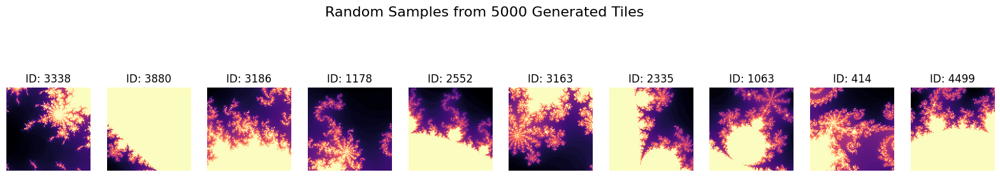

In [10]:
def show_random_samples(dataset, num_display=10):
    # Select random indices
    indices = random.sample(range(len(dataset)), num_display)
    
    plt.figure(figsize=(20, 4))
    for i, idx in enumerate(indices):
        plt.subplot(1, num_display, i + 1)
        # Squeeze to remove the channel dimension for plotting
        plt.imshow(dataset[idx].squeeze(), cmap='magma')
        plt.title(f"ID: {idx}")
        plt.axis('off')
    
    plt.suptitle(f"Random Samples from {len(dataset)} Generated Tiles", fontsize=16)
    plt.show()

# Run the display
show_random_samples(X_train)

## Save dataset

In [11]:
# Save compressed binary
np.savez_compressed('mandelbrot_5k.npz', data=X_train.astype('float16'))

# Load
# X_train = np.load('mandelbrot_5k.npz')['data'].astype('float32')

# Train

Epoch 1/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 386ms/step - loss: 0.0794 - val_loss: 0.0875
Epoch 2/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 381ms/step - loss: 0.0786 - val_loss: 0.1001
Epoch 3/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0784 - val_loss: 0.0915
Epoch 4/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0778 - val_loss: 0.0882
Epoch 5/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0786

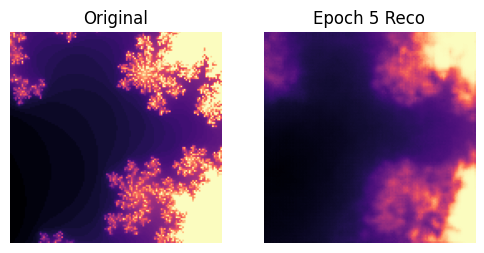

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0781 - val_loss: 0.1202
Epoch 6/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0785 - val_loss: 0.0899
Epoch 7/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0773 - val_loss: 0.0975
Epoch 8/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0785 - val_loss: 0.0918
Epoch 9/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0768 - val_loss: 0.0915
Epoch 10/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0766

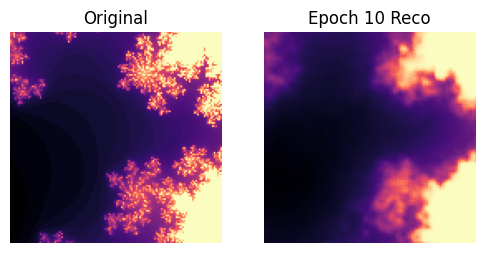

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0766 - val_loss: 0.0916
Epoch 11/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0767 - val_loss: 0.0887
Epoch 12/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0766 - val_loss: 0.0929
Epoch 13/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0754 - val_loss: 0.1019
Epoch 14/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 386ms/step - loss: 0.0754 - val_loss: 0.0894
Epoch 15/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0749

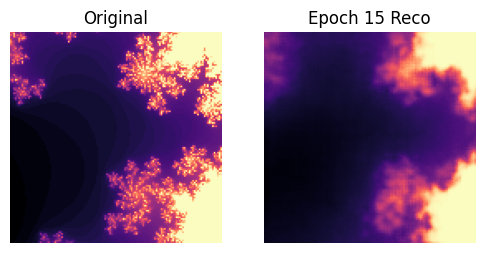

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0759 - val_loss: 0.0905
Epoch 16/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 384ms/step - loss: 0.0751 - val_loss: 0.0920
Epoch 17/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0750 - val_loss: 0.0917
Epoch 18/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0751 - val_loss: 0.0893
Epoch 19/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 384ms/step - loss: 0.0750 - val_loss: 0.0909
Epoch 20/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 393ms/step - loss: 0.0746

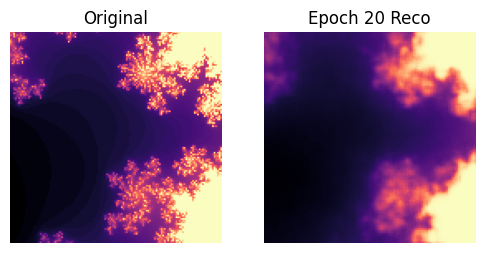

71/71 ━━━━━━━━━━━━━━━━━━━━ 29s 406ms/step - loss: 0.0748 - val_loss: 0.0889
Epoch 21/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 386ms/step - loss: 0.0736 - val_loss: 0.0908
Epoch 22/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0732 - val_loss: 0.0896
Epoch 23/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0733 - val_loss: 0.0895
Epoch 24/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 381ms/step - loss: 0.0728 - val_loss: 0.0905
Epoch 25/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - loss: 0.0730

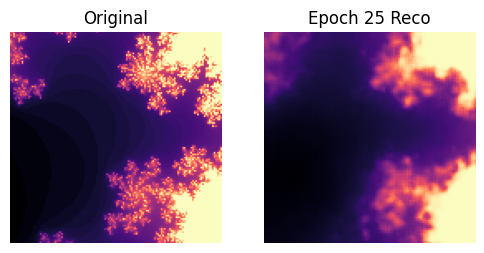

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0731 - val_loss: 0.0922
Epoch 26/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0727 - val_loss: 0.0911
Epoch 27/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0729 - val_loss: 0.0917
Epoch 28/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 379ms/step - loss: 0.0721 - val_loss: 0.0905
Epoch 29/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 379ms/step - loss: 0.0719 - val_loss: 0.0910
Epoch 30/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - loss: 0.0709

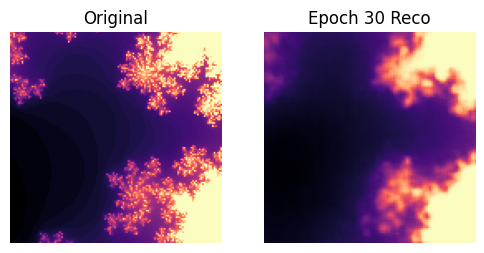

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0716 - val_loss: 0.0910
Epoch 31/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 376ms/step - loss: 0.0726 - val_loss: 0.0897
Epoch 32/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0719 - val_loss: 0.0903
Epoch 33/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0716 - val_loss: 0.0918
Epoch 34/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0713 - val_loss: 0.0923
Epoch 35/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 369ms/step - loss: 0.0714

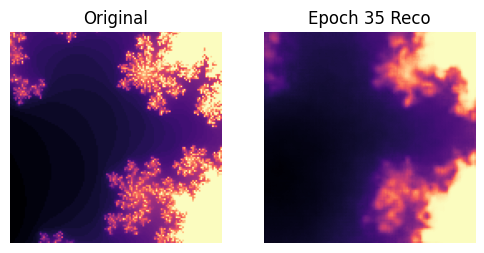

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0715 - val_loss: 0.0910
Epoch 36/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0711 - val_loss: 0.0922
Epoch 37/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0712 - val_loss: 0.0910
Epoch 38/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 393ms/step - loss: 0.0707 - val_loss: 0.0914
Epoch 39/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0705 - val_loss: 0.0940
Epoch 40/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 368ms/step - loss: 0.0706

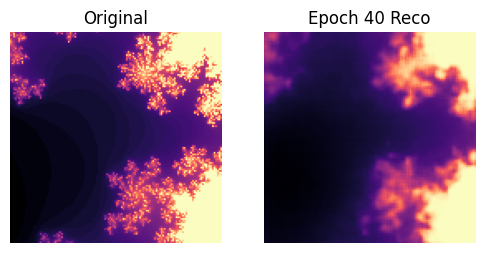

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0711 - val_loss: 0.0912
Epoch 41/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 378ms/step - loss: 0.0706 - val_loss: 0.0908
Epoch 42/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 376ms/step - loss: 0.0701 - val_loss: 0.0918
Epoch 43/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0703 - val_loss: 0.0922
Epoch 44/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0708 - val_loss: 0.0931
Epoch 45/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 382ms/step - loss: 0.0717

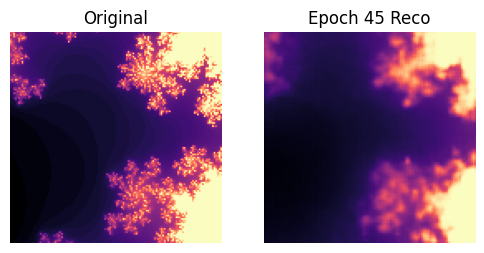

71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 396ms/step - loss: 0.0709 - val_loss: 0.0947
Epoch 46/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 29s 404ms/step - loss: 0.0707 - val_loss: 0.0914
Epoch 47/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 395ms/step - loss: 0.0701 - val_loss: 0.0913
Epoch 48/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 397ms/step - loss: 0.0695 - val_loss: 0.0920
Epoch 49/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 393ms/step - loss: 0.0694 - val_loss: 0.0906
Epoch 50/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 371ms/step - loss: 0.0681

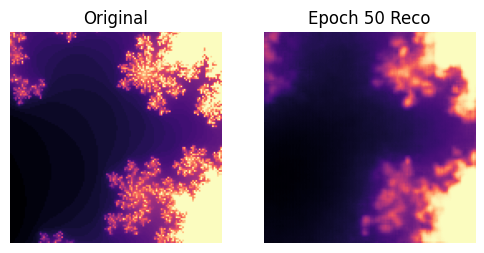

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0693 - val_loss: 0.0912
Epoch 51/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0691 - val_loss: 0.0974
Epoch 52/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 381ms/step - loss: 0.0699 - val_loss: 0.0940
Epoch 53/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 377ms/step - loss: 0.0694 - val_loss: 0.0925
Epoch 54/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 379ms/step - loss: 0.0688 - val_loss: 0.0917
Epoch 55/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step - loss: 0.0685

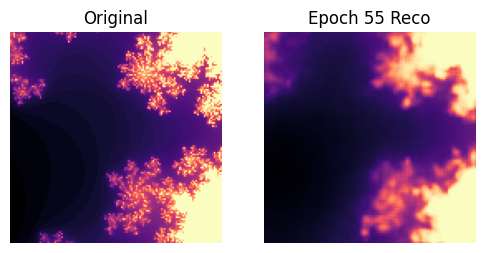

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 386ms/step - loss: 0.0688 - val_loss: 0.0932
Epoch 56/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 381ms/step - loss: 0.0691 - val_loss: 0.0923
Epoch 57/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0697 - val_loss: 0.0915
Epoch 58/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0694 - val_loss: 0.0931
Epoch 59/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 380ms/step - loss: 0.0692 - val_loss: 0.0924
Epoch 60/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 370ms/step - loss: 0.0679

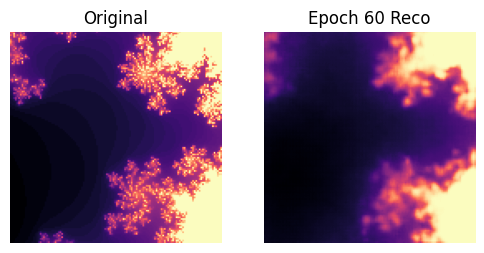

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 382ms/step - loss: 0.0685 - val_loss: 0.0933
Epoch 61/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 386ms/step - loss: 0.0684 - val_loss: 0.0956
Epoch 62/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 386ms/step - loss: 0.0685 - val_loss: 0.0922
Epoch 63/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 379ms/step - loss: 0.0681 - val_loss: 0.0915
Epoch 64/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 381ms/step - loss: 0.0681 - val_loss: 0.0948
Epoch 65/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 373ms/step - loss: 0.0684

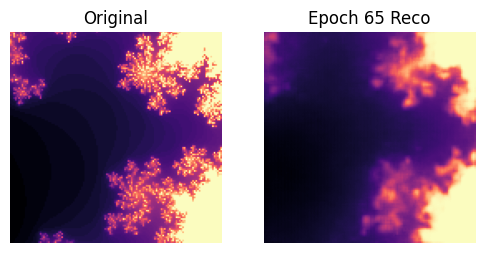

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 387ms/step - loss: 0.0688 - val_loss: 0.0943
Epoch 66/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 381ms/step - loss: 0.0687 - val_loss: 0.0923
Epoch 67/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 378ms/step - loss: 0.0679 - val_loss: 0.0931
Epoch 68/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 379ms/step - loss: 0.0680 - val_loss: 0.0969
Epoch 69/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 387ms/step - loss: 0.0677 - val_loss: 0.0970
Epoch 70/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - loss: 0.0682

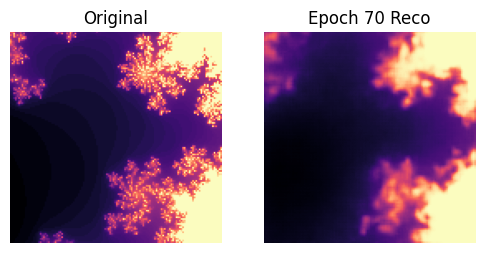

71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 389ms/step - loss: 0.0686 - val_loss: 0.0935
Epoch 71/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0682 - val_loss: 0.0947
Epoch 72/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 387ms/step - loss: 0.0683 - val_loss: 0.0931
Epoch 73/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0681 - val_loss: 0.1042
Epoch 74/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 386ms/step - loss: 0.0681 - val_loss: 0.0940
Epoch 75/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 374ms/step - loss: 0.0676

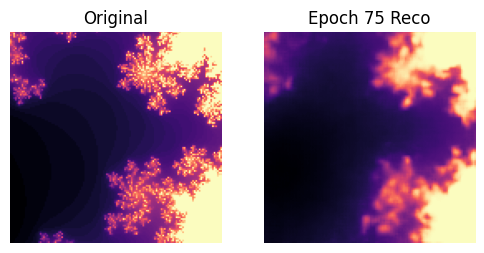

71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 387ms/step - loss: 0.0678 - val_loss: 0.0939
Epoch 76/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 389ms/step - loss: 0.0680 - val_loss: 0.0958
Epoch 77/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 390ms/step - loss: 0.0677 - val_loss: 0.0943
Epoch 78/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0676 - val_loss: 0.0932
Epoch 79/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 387ms/step - loss: 0.0673 - val_loss: 0.0932
Epoch 80/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - loss: 0.0663

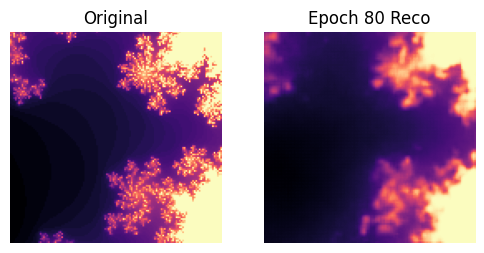

71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 391ms/step - loss: 0.0672 - val_loss: 0.0939
Epoch 81/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 389ms/step - loss: 0.0672 - val_loss: 0.0940
Epoch 82/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 384ms/step - loss: 0.0673 - val_loss: 0.0940
Epoch 83/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 387ms/step - loss: 0.0668 - val_loss: 0.0948
Epoch 84/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 388ms/step - loss: 0.0670 - val_loss: 0.0938
Epoch 85/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 383ms/step - loss: 0.0668

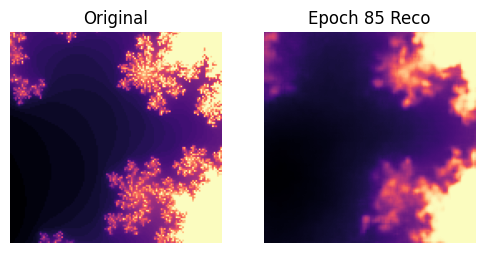

71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 395ms/step - loss: 0.0668 - val_loss: 0.0947
Epoch 86/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 388ms/step - loss: 0.0671 - val_loss: 0.0968
Epoch 87/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 383ms/step - loss: 0.0675 - val_loss: 0.0931
Epoch 88/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 384ms/step - loss: 0.0669 - val_loss: 0.0950
Epoch 89/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 385ms/step - loss: 0.0672 - val_loss: 0.0925
Epoch 90/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 376ms/step - loss: 0.0662

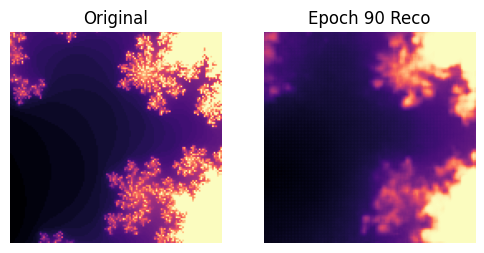

71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 389ms/step - loss: 0.0669 - val_loss: 0.0951
Epoch 91/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 388ms/step - loss: 0.0666 - val_loss: 0.0944
Epoch 92/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 392ms/step - loss: 0.0665 - val_loss: 0.0971
Epoch 93/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 390ms/step - loss: 0.0664 - val_loss: 0.0939
Epoch 94/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 392ms/step - loss: 0.0663 - val_loss: 0.0988
Epoch 95/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 377ms/step - loss: 0.0666

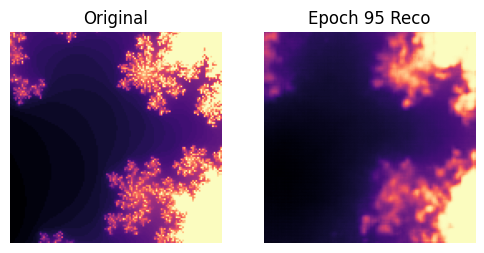

71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 389ms/step - loss: 0.0665 - val_loss: 0.1012
Epoch 96/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 391ms/step - loss: 0.0671 - val_loss: 0.0965
Epoch 97/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 389ms/step - loss: 0.0667 - val_loss: 0.0966
Epoch 98/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 389ms/step - loss: 0.0662 - val_loss: 0.0934
Epoch 99/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 27s 384ms/step - loss: 0.0669 - val_loss: 0.0935
Epoch 100/100
71/71 ━━━━━━━━━━━━━━━━━━━━ 0s 378ms/step - loss: 0.0659

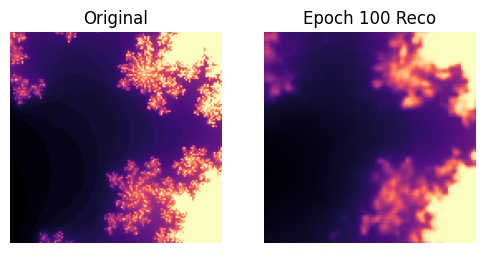

71/71 ━━━━━━━━━━━━━━━━━━━━ 28s 397ms/step - loss: 0.0664 - val_loss: 0.0944


In [16]:
class VisualProgress(Callback):
    def __init__(self, sample_image):
        super().__init__()
        self.sample_image = sample_image

    def on_epoch_end(self, epoch, logs=None):
        if (epoch + 1) % 5 == 0:
            # Predict the reconstruction
            reco = self.model.predict(self.sample_image[np.newaxis, ...], verbose=0)[0]
            
            plt.figure(figsize=(6, 3))
            plt.subplot(1, 2, 1)
            plt.imshow(self.sample_image.squeeze(), cmap='magma')
            plt.title("Original")
            plt.axis('off')
            
            plt.subplot(1, 2, 2)
            plt.imshow(reco.squeeze(), cmap='magma')
            plt.title(f"Epoch {epoch+1} Reco")
            plt.axis('off')
            plt.show()

# 1. Prepare data (ensure it is float32 for Keras)
X_train_final = X_train.astype('float32')

# 2. Pick a "test" image to watch during training
test_img = X_train_final[0]

# 3. Fit the model
history = autoencoder.fit(
    X_train_final, X_train_final,
    epochs=100,
    batch_size=64,
    shuffle=True,
    validation_split=0.1,
    callbacks=[VisualProgress(test_img)]
)

In [17]:
# Save the full Autoencoder 
autoencoder.save("mandelbrot_autoencoder_v1.keras")

# Save the Decoder part
decoder.save("mandelbrot_decoder_v1.keras")

# Save the Encoder
encoder.save("mandelbrot_encoder_v1.keras")

print("Models saved successfully in .keras format.")

Models saved successfully in .keras format.


# Explore the latent space

## Original -> latent -> reconstruction plots

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


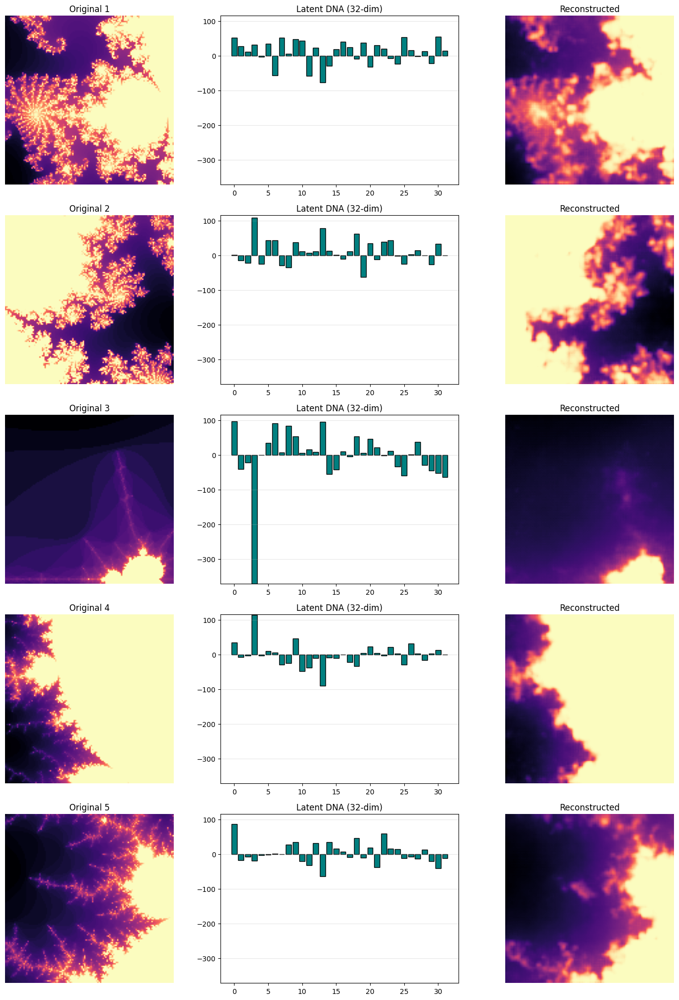

In [20]:
def plot_full_pipeline(model_ae, model_encoder, dataset, num_samples=5):
    indices = np.random.choice(len(dataset), num_samples, replace=False)
    samples = dataset[indices].astype('float32')
    
    latent_vectors = model_encoder.predict(samples)
    reconstructions = model_ae.predict(samples)
    
    # Plot
    fig, axes = plt.subplots(num_samples, 3, figsize=(15, 4 * num_samples))
    
    # Global y-limits for bar plots to make comparison fair
    y_min, y_max = np.min(latent_vectors) - 0.5, np.max(latent_vectors) + 0.5
    
    for i in range(num_samples):
        # LEFT: Original
        axes[i, 0].imshow(samples[i].squeeze(), cmap='magma')
        axes[i, 0].set_title(f"Original {i+1}")
        axes[i, 0].axis('off')
        
        # MIDDLE: Latent Bars
        axes[i, 1].bar(range(32), latent_vectors[i], color='teal', edgecolor='black')
        axes[i, 1].set_title("Latent DNA (32-dim)")
        axes[i, 1].set_ylim(y_min, y_max)
        axes[i, 1].grid(axis='y', alpha=0.3)
        
        # RIGHT: Reconstruction
        axes[i, 2].imshow(reconstructions[i].squeeze(), cmap='magma')
        axes[i, 2].set_title("Reconstructed")
        axes[i, 2].axis('off')
        
    plt.tight_layout()
    plt.show()

plot_full_pipeline(autoencoder, encoder, X_train)

## Visualizing randomized latent space vectors

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step


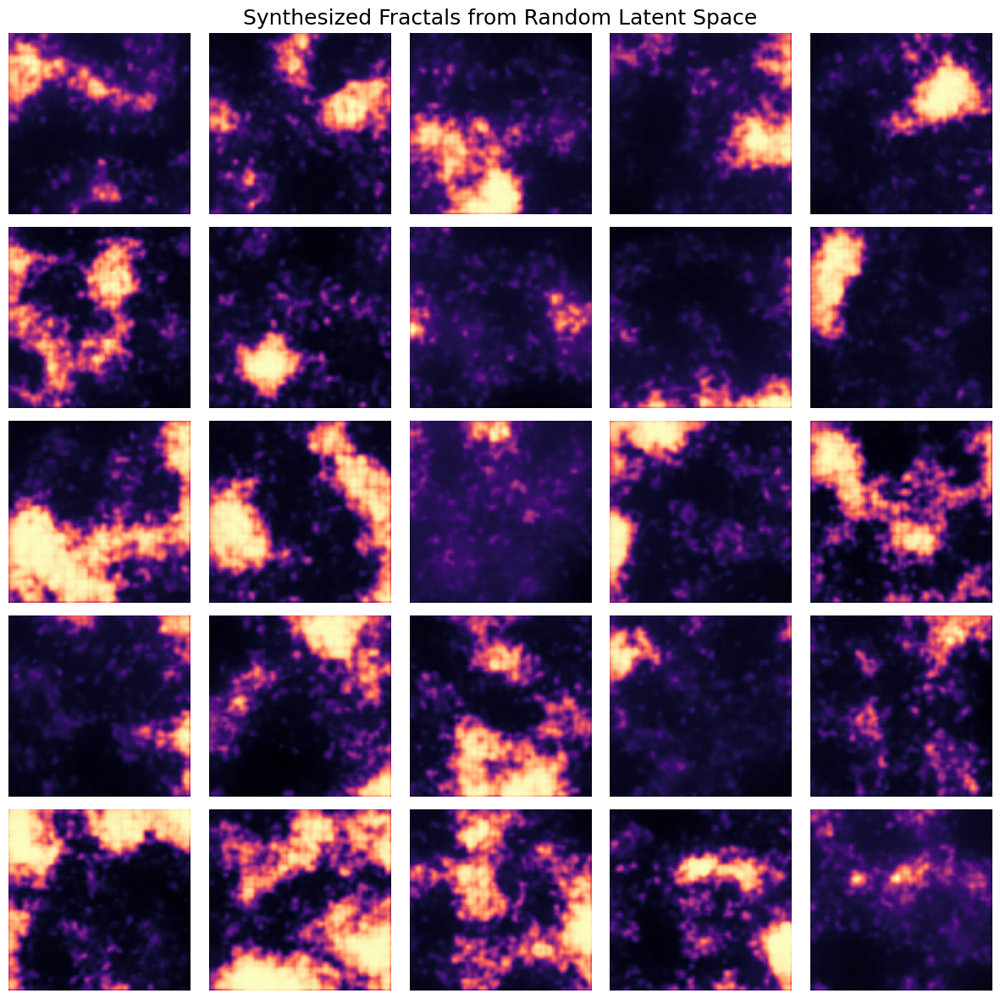

In [44]:
num_images = 25
random_latents = np.random.uniform(-10, 10, size=(num_images, 32))

synthetic_images = decoder.predict(random_latents)

plt.figure(figsize=(12, 12))
for i in range(num_images):
    plt.subplot(5, 5, i + 1)
    plt.imshow(synthetic_images[i].squeeze(), cmap='magma')
    plt.axis('off')

plt.suptitle("Synthesized Fractals from Random Latent Space", fontsize=18)
plt.tight_layout()
plt.show()

## Smoothly fade

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 25ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step


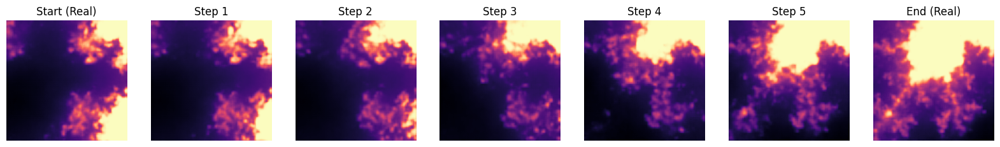

In [36]:
img1 = 0
img2 = 58

# Select two real images
img_start = X_train[img1:(img1+1)].astype('float32')
img_end = X_train[img2:(img2+1)].astype('float32')

# Encode to latent space
latent_start = encoder.predict(img_start)
latent_end = encoder.predict(img_end)

# Linearly interpolate
steps = 7
alphas = np.linspace(0, 1, steps)
interpolated_latents = np.array([(1 - a) * latent_start + a * latent_end for a in alphas])
interpolated_latents = interpolated_latents.reshape(steps, 32)

# Decode latent -> image
morphed_images = decoder.predict(interpolated_latents)

# Plot
plt.figure(figsize=(20, 4))

for i in range(steps):
    plt.subplot(1, steps, i + 1)
    plt.imshow(morphed_images[i].squeeze(), cmap='magma')
    
    # Dynamic title logic
    if i == 0:
        t = "Start (Real)"
    elif i == steps - 1:
        t = "End (Real)"
    else:
        t = f"Step {i}"
        
    plt.title(t)
    plt.axis('off')

## Animation

In [49]:
smooth_steps = 64
alphas = np.linspace(0, 1, smooth_steps)
smooth_latents = np.array([(1 - a) * latent_start + a * latent_end for a in alphas])
smooth_latents = smooth_latents.reshape(smooth_steps, 32)

# Decode smooth
smooth_images = decoder.predict(smooth_latents, verbose=0)

# Create ping-pong animation
# This creates a perfect loop from start -> end -> start
ping_pong = np.concatenate([smooth_images, smooth_images[::-1][1:-1]], axis=0)

# Animation Setup
fig, ax = plt.subplots(figsize=(6, 6))
ax.axis('off')
im = ax.imshow(ping_pong[0].squeeze(), cmap='magma')

def update(i):
    im.set_array(ping_pong[i].squeeze())
    return [im]

# Render HTML
ani = animation.FuncAnimation(fig, update, frames=len(ping_pong), interval=40)
plt.close() # Hide static plot

HTML(ani.to_jshtml())